In [ ]:
'''
Cse 428 Final Project.
'''
STUDENT_IDs = ['18201121', '18201151', '18201160']

In [ ]:
!git clone https://github.com/ultralytics/yolov5
%cd yolov5
%pip install -qr requirements.txt # installing dependencies
%pip install -q roboflow 

import torch
import os
from IPython.display import Image, clear_output # to display image

print(f"Setup Complete. Using torch {torch.__version__}")
if torch.cuda.is_available():
  print(f"Using CUDA: {torch.cuda.get_device_properties(0).name}")
else:
  print("Using CPU.")

fatal: destination path 'yolov5' already exists and is not an empty directory.
/content/yolov5
Setup Complete. Using torch 1.10.0+cu111
Using CUDA: Tesla T4


In [ ]:
from roboflow import Roboflow
rf = Roboflow(model_format="yolov5", notebook="ultralytics")

upload and label your dataset, and get an API KEY here: https://app.roboflow.com/?model=yolov5&ref=ultralytics


In [ ]:
# setting up environment
os.environ["DATASET_DIRECTORY"] = "/content/datasets"

Getting the Dataset from roboflow:

In [ ]:
rf = Roboflow(api_key="CgUe5mFuRHAjYWLnsYJi")
project = rf.workspace().project("p2_dhaka_dataset-f6ba6")
dataset = project.version(7).download("yolov5")

loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to /content/datasets/P2_Dhaka_Dataset-7 in yolov5pytorch:: 100%|██████████| 1343/1343 [00:01<00:00, 740.59it/s]


Training the YOLO Model

In [ ]:
!python train.py --img 768 --batch 16 --epochs 100 --data {dataset.location}/data.yaml --weights yolov5s.pt --cache

train: weights=yolov5s.pt, cfg=, data=/content/datasets/P2_Dhaka_Dataset-7/data.yaml, hyp=data/hyps/hyp.scratch.yaml, epochs=100, batch_size=16, imgsz=768, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, linear_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v6.0-192-g436ffc4 torch 1.10.0+cu111 CUDA:0 (Tesla T4, 15110MiB)

hyperparameters: lr0=0.01, lrf=0.1, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_gamma=0.0, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, degr

Showing Results:

In [ ]:
%load_ext tensorboard
%tensorboard --logdir runs


<IPython.core.display.Javascript object>

Prediction:

In [ ]:
!python detect.py --weights /content/yolov5/runs/train/exp5/weights/best.pt --img 768 --conf 0.5 --source {dataset.location}/valid/images

detect: weights=['/content/yolov5/runs/train/exp5/weights/best.pt'], source=/content/datasets/P2_Dhaka_Dataset-7/valid/images, data=data/coco128.yaml, imgsz=[768, 768], conf_thres=0.5, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.0-192-g436ffc4 torch 1.10.0+cu111 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
Model Summary: 213 layers, 7031701 parameters, 0 gradients, 15.9 GFLOPs
image 1/39 /content/datasets/P2_Dhaka_Dataset-7/valid/images/IMG_0009-0006_jpg.rf.3b20608a0843c423d48cdcffde2cfb90.jpg: 448x768 1 car, 1 cng, 1 motorcycle, 2 other-vehicles, 2 persons, 1 rickshaw, Done. (0.029s)
image 2/39 /content/datasets/P2_Dhaka_Dataset-7/valid/images/IMG_0009-0021_jpg.rf.82ca63ca277d80cbf8a8cf11fdd35de5.j

Displaying Inference Images:

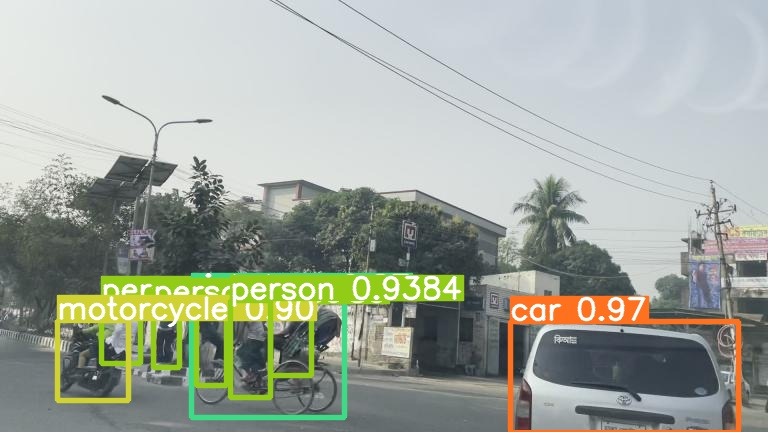

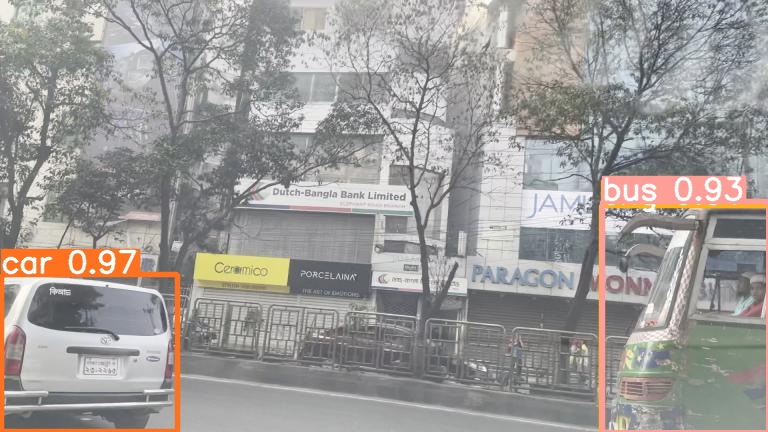

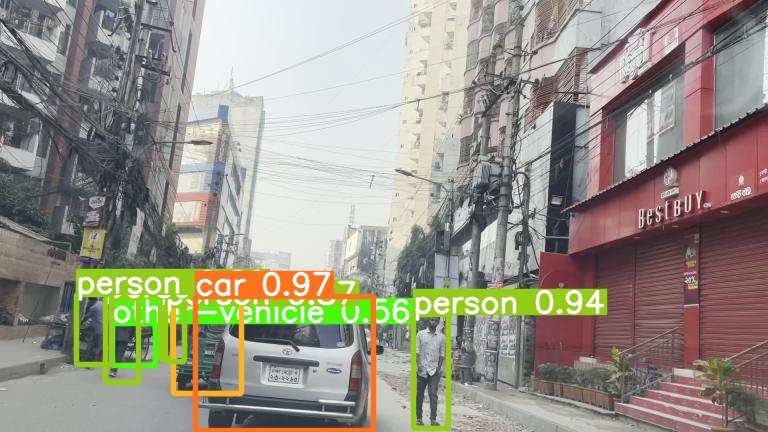

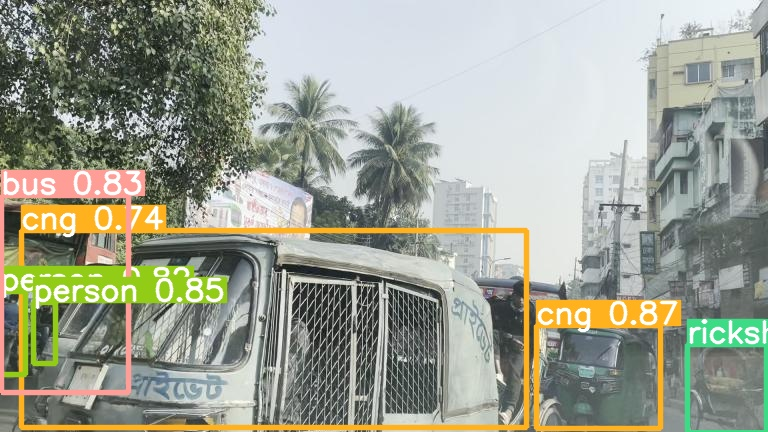

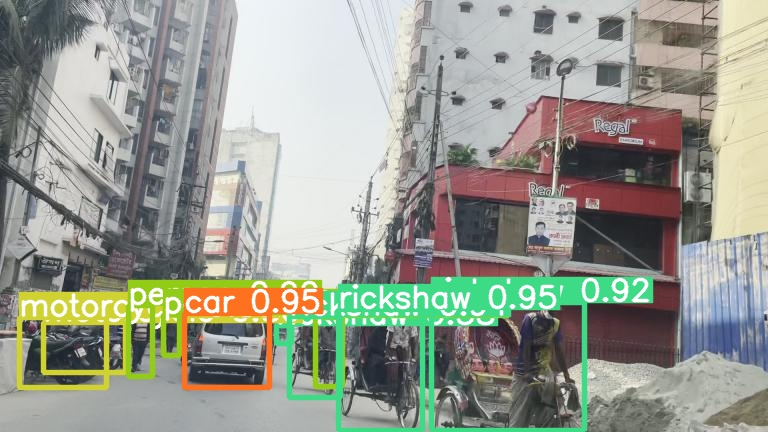

...

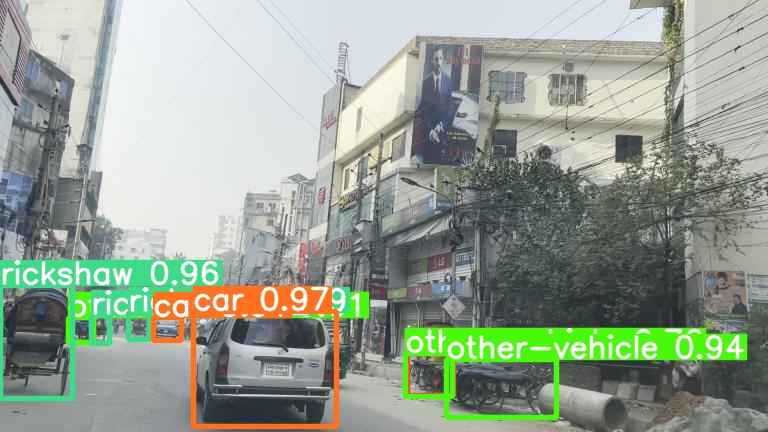

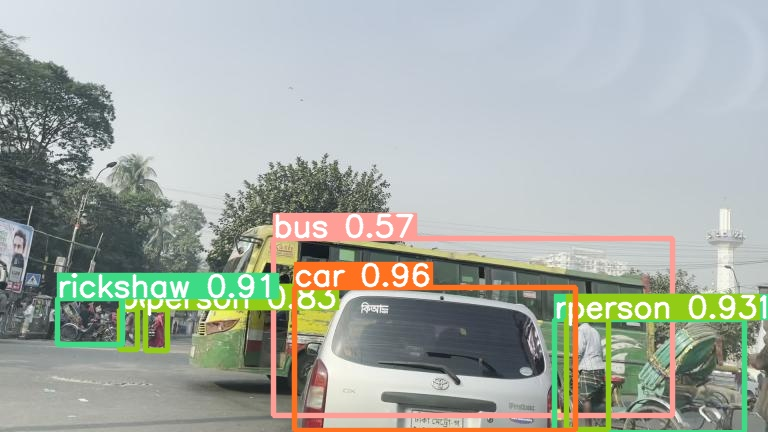

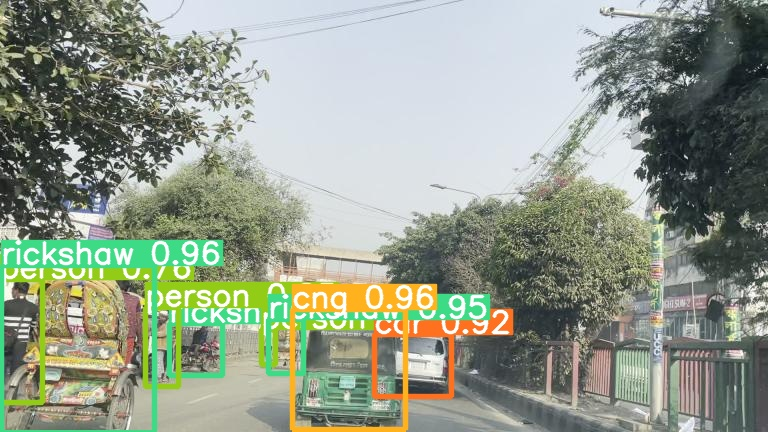

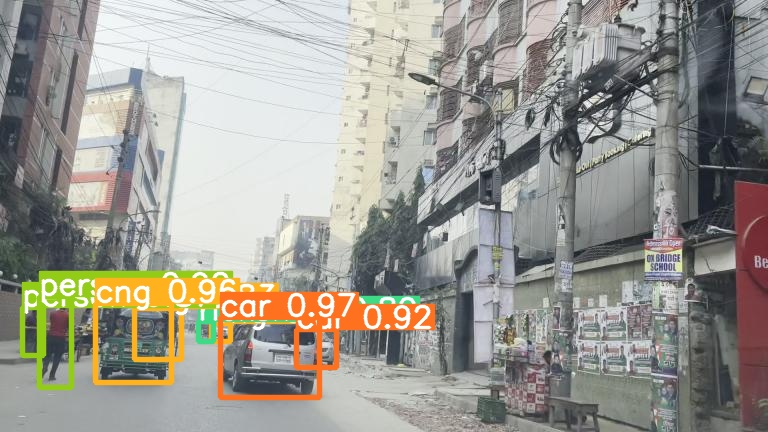

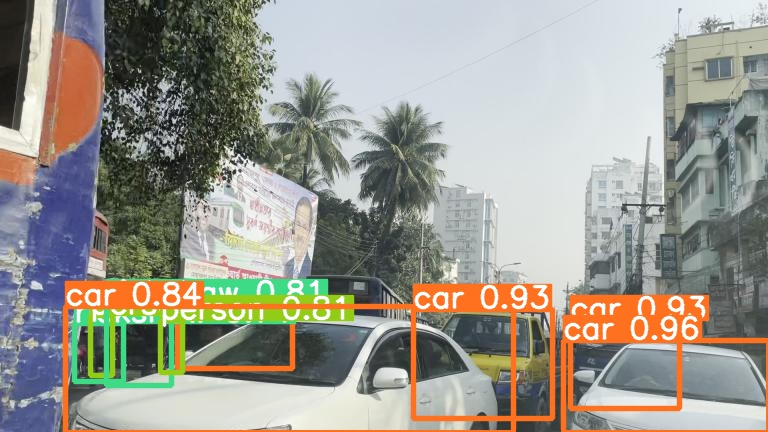

In [ ]:
# display inference on ALL test images:

import glob
from IPython.display import Image, display

i = 0
# choose the correct exp folder - see prev output block
for imageName in glob.glob('/content/yolov5/runs/detect/exp2/*.jpg'): #assuming JPG
  i += 1
  
  if i < 40:
    display(Image(filename=imageName))
    print("\n")

Saving the Model:

In [ ]:
# export the model's weights for future use:

from google.colab import files
files.download('/content/yolov5/runs/train/exp5/weights/best.pt')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

# About Dataset:
Download dataset from the link below-

https://app.roboflow.com/ds/RV7qjxi6nn?key=kZj9n6BYu9

## Data Collection:
We took 3 different cars: A minivan, a wagon, and an SUV. Then, we recorded road scenes of dhaka at the same time from 3 different perspectives. Each of the 3 cars maintained different lanes, had 3 camera angles, but cruised through the same roads at the same time.
We carried this on for 1 hour and 15 minutes.

### The 3 Cars:

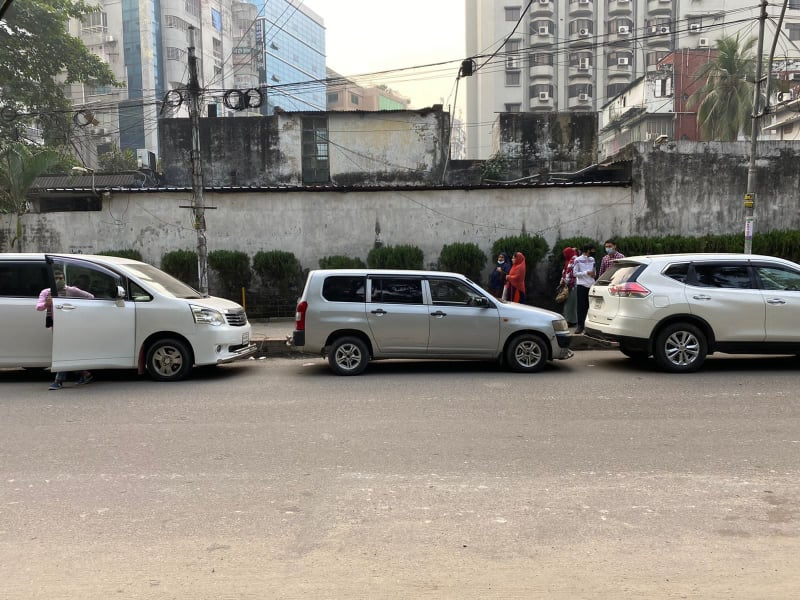


### The 3 Perspectives:

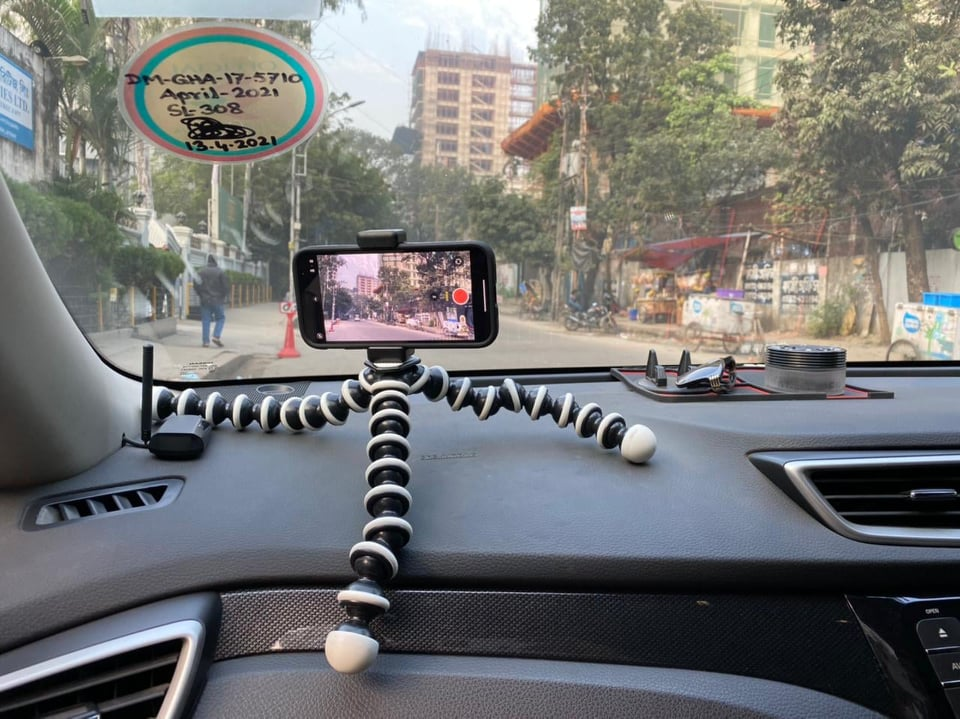

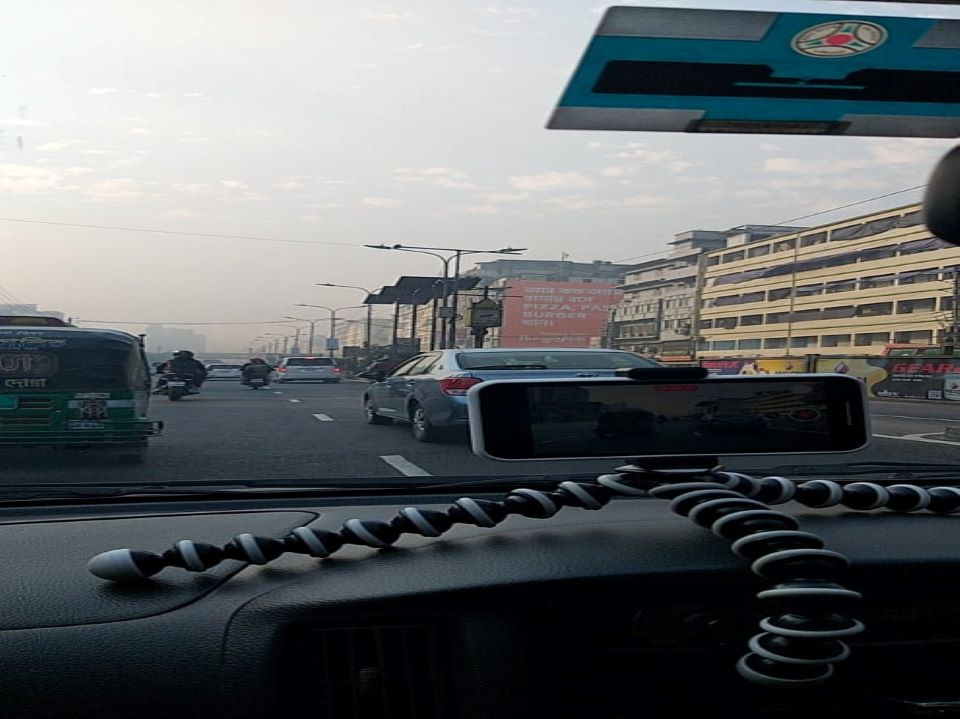



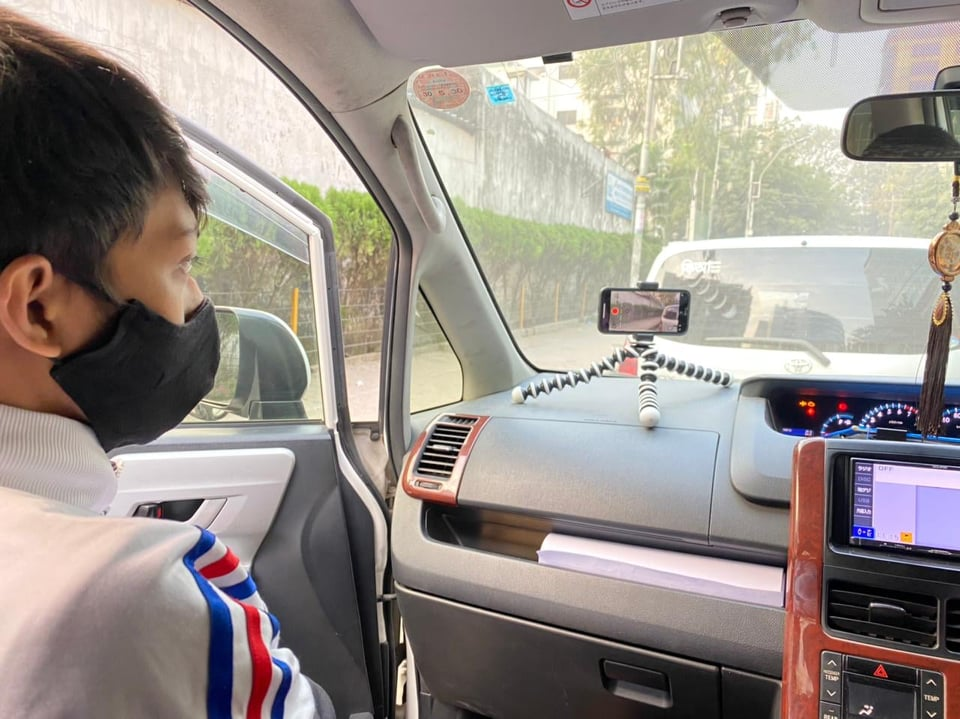

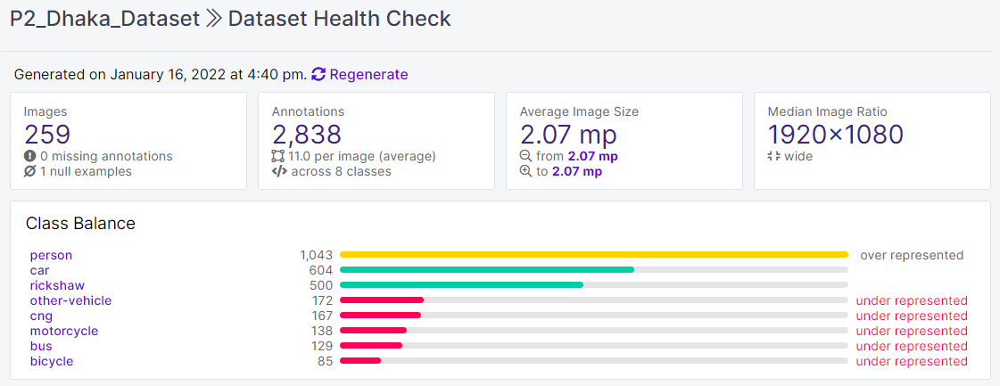